# HPC Anomaly Detection: GNN training

## Preliminary steps

In [1]:
! pip install dgl torch_geometric torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 55.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 57.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=d1fe272b63de6a3fbb85faf54f9b26e705a84447596a5b5b93365c3b5a21d1b4
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4130 sha256=86f130a845726863b27e8745d1dffe8d1085050cf028b6af26890b6c5c86d27c
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torch_geometric torchviz


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! if ! [ -d data ]; then cp -r drive/MyDrive/HPCDATA/data .; fi
! if ! [ -d utils ]; then cp -r drive/MyDrive/HPCDATA/utils .; fi

In [27]:
import itertools
import json
import logging
import os
import shutil
import random
from timeit import default_timer

import dgl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import (auc, roc_curve, confusion_matrix,
                            ConfusionMatrixDisplay,precision_recall_curve,
                            classification_report)
from torch import nn
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv
from torchviz import make_dot

from utils.data_processing import *
from utils.training_simple import *
from utils.plotting import *

from tqdm.notebook import tqdm

## Reproducibility

In [5]:
RANDOM_SEED = None # Set a random seed to allow for reproducibility (it will slow down computations)

def set_reproducibility(seed):
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.use_deterministic_algorithms(True)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  os.environ['CUBLAS_WORKSPACE_CONFIG']=':16:8'

def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

g = None
if RANDOM_SEED is not None:
  g = torch.Generator()
  g.manual_seed(RANDOM_SEED)
  set_reproducibility(RANDOM_SEED)

## Read and process Node Metrics

In [6]:
AGGREGATED_METRICS_PATH = "data/aggregated/"
JOB_TABLE_PATH = 'data/job_table.parquet'
RACKS_DATA_PATH = 'data/racks_spatial_distribution.json'
WINDOW_SIZE = 10
DROP_TH = 100
KEEPRACKS = np.arange(23,28)
KEEPNODES = np.arange(460,559).astype(str) # set it no None if you don't want to filter nodes

In [7]:
data = load_metrics(AGGREGATED_METRICS_PATH,racks=KEEPRACKS)
data = process_metrics(data,KEEPNODES,DROP_TH)
data.head()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

,timestamp,460,461,463,464,465,467,468,469,470,...,551,552,553,554,555,556,557,558,values,anomalies
0,2022-03-31 02:45:00+00:00,"[0.539976015665201, 0.5405405022263785, 0.5315...","[0.3955845662662844, 0.40540536593020815, 0.37...","[0.4160699413210467, 0.43243241037276337, 0.38...","[0.46081933488446114, 0.47747745580482015, 0.4...","[0.4759347584335139, 0.48648649925787385, 0.45...","[0.5871120678300974, 0.6036036345645427, 0.576...","[0.5280428440482905, 0.5495495456794321, 0.504...","[0.5684167170740713, 0.5945945911114889, 0.540...","[0.612370456611576, 0.6216216355540441, 0.6036...",...,"[0.6630866180691942, 0.6756756385225489, 0.657...","[0.7486076813237196, 0.7477477283971609, 0.747...","[0.7484088436863042, 0.7477477283971609, 0.756...","[0.7758549927365993, 0.7837838162927697, 0.783...","[0.8110581160655834, 0.8108107748187192, 0.819...","[0.7800315542463185, 0.7837838162927697, 0.783...","[0.8337308265224157, 0.8378378192612744, 0.837...","[25.564450412326387, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
1,2022-03-31 03:00:00+00:00,"[0.5129274204992378, 0.5045045002473754, 0.522...","[0.3570007782344892, 0.3513513629617035, 0.360...","[0.3747015766319405, 0.36936936395120507, 0.37...","[0.41865537686469456, 0.4144144093832618, 0.42...","[0.4331741661110016, 0.4234234528363155, 0.432...","[0.5624501919608657, 0.5585585891324859, 0.558...","[0.49602203334669837, 0.4954954567943217, 0.49...","[0.5397770566372865, 0.5495495456794321, 0.531...","[0.590095239343826, 0.5855855476584353, 0.5945...",...,"[0.6591088941968907, 0.6666666809861009, 0.639...","[0.7482098846583893, 0.7477477283971609, 0.738...","[0.749403031873382, 0.7477477283971609, 0.7567...","[0.7750595207964381, 0.7747747728397161, 0.774...","[0.810262401344424, 0.8108107748187192, 0.8108...","[0.7800316756368176, 0.7837838162927697, 0.783...","[0.832338720279509, 0.8378378192612744, 0.8378...","[25.533336046006944, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,2022-03-31 03:15:00+00:00,"[0.5151152414633041, 0.5045045002473754, 0.522...","[0.360381867804047, 0.3513513629617035, 0.3603...","[0.37708811384292334, 0.3783784074042587, 0.37...","[0.4196496864422715, 0.4234234528363155, 0.423...","[0.4321796744476762, 0.43243241037276337, 0.43...","[0.5626489689030316, 0.5675675466689337, 0.558...","[0.492442227530224, 0.4954954567943217, 0.4774...","[0.5385837880317951, 0.5495495456794321, 0.522...","[0.5922830603078925, 0.6036036345645427, 0.594...",...,"[0.649562259790963, 0.6576576375330473, 0.6306...","[0.7400557206668658, 0.7387387708607129, 0.738...","[0.7420443398220197, 0.7387387708607129, 0.747...","[0.7690928135974837, 0.7657657293866624, 0.774...","[0.8062846774721205, 0.8018018172822713, 0.810...","[0.7746619669121062, 0.7747747728397161, 0.774...","[0.8287589144630344, 0.8198198182717729, 0.837...","[25.457777235243057, 25.600000381469727, 25.20...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
3,2022-03-31 03:30:00+00:00,"[0.5079552656588584, 0.5045045002473754, 0.513...","[0.3534208510275159, 0.3513513629617035, 0.360...","[0.3729116130284538, 0.3783784074042587, 0.378...","[0.4188542751973597, 0.4234234528363155, 0.414...","[0.4349641904097378, 0.45045041136226494, 0.43...","[0.5670245501359148, 0.5675675466689337, 0.558...","[0.4996021426394202, 0.5135135437004291, 0.495...","[0.5459426014736564, 0.5585585891324859, 0.540...","[0.5956641498774502, 0.5945945911114889, 0.594...",...,"[0.6549322719919222, 0.6666666809861009, 0.648...","[0.7452264703636629, 0.7477477283971609, 0.747...","[0.7452264703636629, 0.7387387708607129, 0.756...","[0.7716784312268805, 0.7657657293866624, 0.774...","[0.8080744589898586, 0.8018018172822713, 0.810...","[0.777843733282252, 0.7747747728397161, 0.7837...","[0.8311456944550154, 0.8288

## Read Jobs and Racks Tables

In [8]:
node_columns = data.columns[1:-3]
nodes = list(node_columns.astype(int))

racks = pd.read_json(RACKS_DATA_PATH)

jobtable = pd.read_parquet(JOB_TABLE_PATH)[['start_time','end_time','nodes']]
jobtable = jobtable.dropna(subset=['nodes'])
jobtable.nodes = jobtable.nodes.map(lambda x:np.fromstring(x.strip(']['),dtype=int,sep=',')) # map nodelist from str to array
jobtable.nodes = jobtable.nodes.map(lambda a : np.intersect1d(a,nodes)) # Keep only jobs where the selected nodes appear
jobtable = jobtable[jobtable.nodes.map(len)>0] # Drop rows without any node of interest
jobtable = jobtable.reset_index() # Not really necessary, but meh
print("Data covering the period from {} to {}".format(jobtable.start_time.min().date(),jobtable.end_time.max().date()))
jobtable.head()

Data covering the period from 2022-03-31 to 2022-04-30


,index,start_time,end_time,nodes
0,19,2022-04-02 05:36:25+00:00,2022-04-02 13:23:12+00:00,"[529, 530, 531, 532, 533, 534, 535, 536]"
1,780,2022-04-01 23:28:45+00:00,2022-04-01 23:29:22+00:00,"[467, 493, 494, 495, 512, 513, 514]"
2,2096,2022-04-02 16:09:02+00:00,2022-04-02 16:11:31+00:00,"[474, 491, 512, 536, 552]"
3,2953,2022-04-08 22:16:15+00:00,2022-04-09 05:46:26+00:00,"[463, 464, 488, 489, 507, 512, 513, 522, 542]"
4,3015,2022-04-09 06:01:58+00:00,2022-04-09 06:02:12+00:00,[464]


## Create graphs

In [9]:
def build_graph(jobs):
  edge_list = jobs.nodes.map(lambda x: list(itertools.permutations(x,2))) # build edgelist for each node
  edge_list = edge_list[edge_list.map(len) > 0]
  if len(edge_list) > 0:
    true_edges = np.concatenate(edge_list.values) # remove empty list and collect all
    heatmap = build_heatmap(true_edges)

  else:
    heatmap = np.zeros((980,980))
    true_edges = np.empty(0)

  src,dst = np.nonzero(heatmap)
  graph = dgl.graph((src,dst),num_nodes=980)

  eweights = torch.tensor(heatmap[heatmap.nonzero()],dtype=torch.float32)

  graph = dgl.graph((src,dst),num_nodes=980)
  graph.edata['eweight'] = eweights

  # Drop nodes not contained in the dataset
  drop_nids = [i for i in range(980) if str(i) not in data.columns]
  graph = dgl.remove_nodes(graph, drop_nids, store_ids=True)

  # Add self loops
  graph = dgl.add_self_loop(graph)
  return graph

In [10]:
data_list = []

for i,row in tqdm(data.iterrows(), total=len(data)):
    timestamp = row['timestamp']
    jobs = jobtable[(jobtable['start_time']<timestamp) & (jobtable['end_time']>timestamp)]
    if len(jobs) > 0:
      graph = build_graph(jobs)
      # Graph changes, so are the weights
      eweights = graph.edata['eweight']
      edge_index = torch.stack(graph.edges())
      x = torch.tensor(np.stack(row.iloc[1:-2]),dtype = torch.float32)

      g = Data(edge_index=edge_index,x=x,edge_weight = eweights)
      data_list.append(g)

  0%|          | 0/2963 [00:00<?, ?it/s]

## Model Definition & Training Setup

In [11]:
class anomaly_anticipation(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        #encoder
        self.conv1 = GCNConv(in_channels, 300)
        self.conv2 = GCNConv(300, 100)
        self.conv3 = GCNConv(100, out_channels)

        #dense layer
        self.fc1 = torch.nn.Linear(out_channels,16)
        self.fc2 = torch.nn.Linear(16,1)

    def forward(self, x, edge_index,edge_weight=None):
        x = self.conv1(x, edge_index,edge_weight).relu()
        x = self.conv2(x, edge_index,edge_weight).relu()
        x = self.conv3(x, edge_index,edge_weight).relu()
        x = self.fc1(x)
        x = self.fc2(x)
        return x

conv1.bias torch.Size([300]) 300
conv1.lin.weight torch.Size([300, 416]) 124800
conv2.bias torch.Size([100]) 100
conv2.lin.weight torch.Size([100, 300]) 30000
conv3.bias torch.Size([16]) 16
conv3.lin.weight torch.Size([16, 100]) 1600
fc1.weight torch.Size([16, 16]) 256
fc1.bias torch.Size([16]) 16
fc2.weight torch.Size([1, 16]) 16
fc2.bias torch.Size([1]) 1
Total trainable Params: 157105


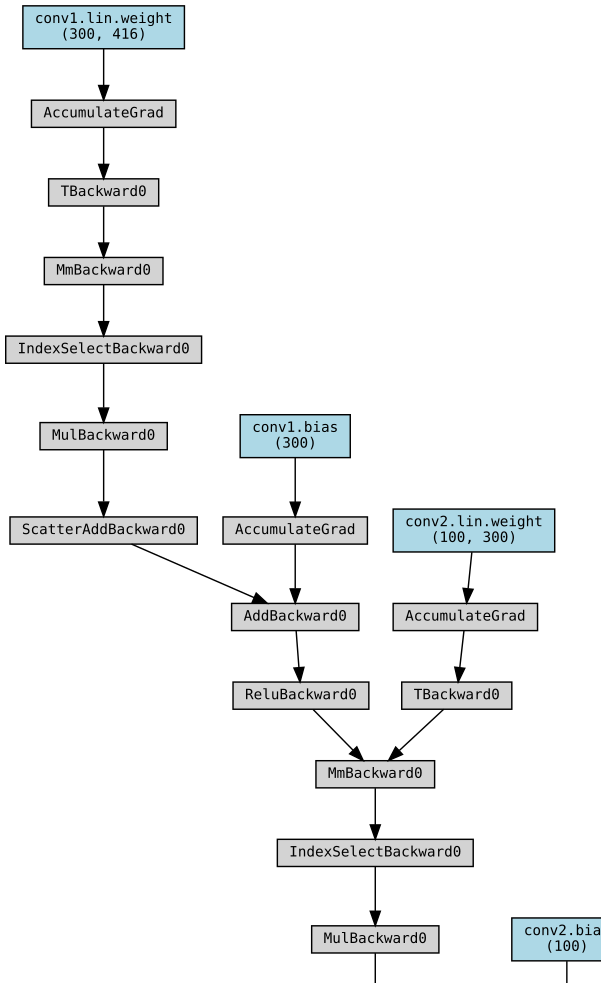

In [12]:
# Create model
in_channels, out_channels = data_list[0].x.shape[1], 16
model = anomaly_anticipation(in_channels,out_channels)

tot_params = 0
for name,param in model.named_parameters():
    print(name,param.shape,param.numel())
    tot_params += param.numel()
print('Total trainable Params:',tot_params)

# Make a forward pass
g = data_list[0]
x = g.x
out = model (x,g.edge_index,g.edge_weight)

# Backtrack to draw the computational graph
make_dot(out, params=dict(list(model.named_parameters())))

In [23]:
def train(train_data, logpath, logger_name, device, num_epochs, initial_lr, batch_size,es_patience, es_min_delta = 0, max_num_ckpt=-1, apply_weight_balancing = False):

  # Create model
  in_channels, out_channels = train_data[0].x.shape[1], 16
  model = anomaly_anticipation(in_channels,out_channels).to(device)

  # Prepare dataloader
  train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = False)

  # Compute weight balancing
  pos_weight = None
  if APPLY_WEIGHT_BALANCING:
    train_labels = torch.cat([g.y for g in train_data])
    train_ones = len(train_labels.nonzero())
    train_zeros = len(train_labels)-train_ones
    pos_weight = torch.tensor(train_zeros/train_ones) * 100
    # pos_weight = torch.tensor(train_ones/train_zeros)

  # Set up training
  criterion = torch.nn.BCEWithLogitsLoss(weight = pos_weight)
  optimizer = torch.optim.Adam([p for p in model.parameters()],lr = initial_lr)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=num_epochs,eta_min=initial_lr * 1e-1)
  trainer =  MyTrainer(model,
                       optimizer,
                       scheduler,
                       es_patience,
                       es_min_delta,
                       max_num_ckpt)

  trainer.train(num_epochs,criterion,train_loader,logger_name,device,logpath)
  model.load_state_dict(torch.load(os.path.join(logpath,'BestModel/best-model.pt'))['model'])
  return model

def get_predictions(model,dataloader,device):
    model.eval()

    preds = []
    y_true = []
    with torch.no_grad():
        for g in tqdm(dataloader):
            g = g.to(device)

            # Forward pass
            logits = model(g.x,g.edge_index,g.edge_weight).squeeze()

            pred = torch.sigmoid(logits)
            preds.append(pred.detach().cpu().numpy())
            y_true.append(g.y.detach().cpu().numpy())

    preds = np.concatenate(preds).astype(float)
    y_true = np.concatenate(y_true).astype(int)

    return pd.DataFrame({'prob': preds,'true_class': y_true})

## Training Setup

In [14]:
TRAIN_SPLIT = 0.7
NUM_EPOCHS = 200
INITIAL_LR = 1e-3

TRAIN_BATCH_SIZE = 64
TEST_BATCH_SIZE = 64

ES_PATIENCE = 50
ES_MIN_DELTA = 0

APPLY_WEIGHT_BALANCING = True # whether to use weight balancing inside the loss

LOGGER_NAME = f'train.output'
BASE_LOGPATH = f'out'

MAX_NUM_CKPT = 10

In [15]:
# Select device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Available device:',device)

if not os.path.exists(BASE_LOGPATH):
  os.makedirs(BASE_LOGPATH)

Available device: cuda


# Window size 4

In [19]:
model = anomaly_anticipation(23,1).to(device)

In [21]:
window_size = 4
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [24]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 2313.5894651099647, Train Acc at 50%: 0.9906835460222645


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 542.920807312879, Train Acc at 50%: 0.9910455697348176


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 472.9352882613811, Train Acc at 50%: 0.9910455697348176


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 372.16363471807404, Train Acc at 50%: 0.9910455697348176


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 254.89060095936284, Train Acc at 50%: 0.9910455697348176


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 188.5191080640782, Train Acc at 50%: 0.9954633903520681


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 173.15080550276042, Train Acc at 50%: 0.9959215766132682


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 167.76515974296316, Train Acc at 50%: 0.9960290524029324


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 161.55423567743688, Train Acc at 50%: 0.9960233957824237


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 154.99027061272514, Train Acc at 50%: 0.9959159199927595


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 148.17878314779617, Train Acc at 50%: 0.9960912752285275


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 141.7824011222735, Train Acc at 50%: 0.9966569372793918


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 132.2698886777084, Train Acc at 50%: 0.9968096660331252


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 130.63989953841977, Train Acc at 50%: 0.9967474432075301


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 130.6467214227532, Train Acc at 50%: 0.9966512806588832


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 129.79245859353787, Train Acc at 50%: 0.9965834012127794


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 129.34912661779347, Train Acc at 50%: 0.9965211783871843


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 128.55158837903883, Train Acc at 50%: 0.9965720879717621


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 126.41363471807404, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 126.51638157299303, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 125.13126753552358, Train Acc at 50%: 0.9966399674178659


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 124.45960041632726, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 123.55678115666576, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 123.79421214589556, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 123.0924065526292, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 123.41309168250521, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 124.3456195130781, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 123.87057652276224, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 124.76836139017105, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 121.85642365824961, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 121.42333016562584, Train Acc at 50%: 0.9966343107973572


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 121.7674110779256, Train Acc at 50%: 0.9967417865870214


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 120.99601773916191, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 120.9010430808218, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 120.65029640691465, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 120.92514028418861, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 119.3543759616255, Train Acc at 50%: 0.9965947144537968


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 120.09136573445561, Train Acc at 50%: 0.9966343107973572


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 119.07904561498778, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 119.05845551633632, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 119.09591365734455, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 117.9445085528102, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 118.0433975925423, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 117.53046655805956, Train Acc at 50%: 0.9966569372793918


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 117.6611910580143, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 116.9292583039189, Train Acc at 50%: 0.9965834012127794


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 117.16479998189881, Train Acc at 50%: 0.9966343107973572


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 116.39664223006606, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 116.28924563308897, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 116.02796633179473, Train Acc at 50%: 0.9965777445922708


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 115.93783374061, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 114.54354466467554, Train Acc at 50%: 0.9966343107973572


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 114.89616707394335, Train Acc at 50%: 0.9966569372793918


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 114.11049642501584, Train Acc at 50%: 0.9966569372793918


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 114.14487736446738, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 113.79592044528917, Train Acc at 50%: 0.9966739071409177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 114.13096207801611, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 113.27921078830663, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 113.49675309982804, Train Acc at 50%: 0.9965720879717621


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 112.61646981627297, Train Acc at 50%: 0.9966908770024436


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 112.70436238573626, Train Acc at 50%: 0.9966739071409177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 112.75772694361481, Train Acc at 50%: 0.9966116843153227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 111.91474341569372, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 112.60264503574984, Train Acc at 50%: 0.9965777445922708


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 110.8130826319124, Train Acc at 50%: 0.9966569372793918


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 111.56041270703231, Train Acc at 50%: 0.996685220381935


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 111.36434292696171, Train Acc at 50%: 0.996685220381935


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 111.4565458412526, Train Acc at 50%: 0.9966286541768485


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 110.99984161462575, Train Acc at 50%: 0.9965947144537968


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 110.34584577789845, Train Acc at 50%: 0.9966286541768485


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 110.44152185718164, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 110.61067743687211, Train Acc at 50%: 0.9964363290795547


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 109.66982306091049, Train Acc at 50%: 0.9966286541768485


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 111.1199656077473, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 108.59151280658884, Train Acc at 50%: 0.9967135034844782


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 109.65440311340393, Train Acc at 50%: 0.9968040094126165


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 110.35295049325731, Train Acc at 50%: 0.9964250158385374


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 108.19936193320663, Train Acc at 50%: 0.9966399674178659


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 110.06643135125351, Train Acc at 50%: 0.9966003710743053


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 108.0923386731831, Train Acc at 50%: 0.9966682505204091


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 107.57104715358857, Train Acc at 50%: 0.996702190243461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 108.51225224002172, Train Acc at 50%: 0.9967870395510906


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 109.14512625576975, Train Acc at 50%: 0.9962270341207349


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 108.31795863879084, Train Acc at 50%: 0.996922798443298


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 109.52207213322473, Train Acc at 50%: 0.996606027694814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 106.73766856729115, Train Acc at 50%: 0.9967870395510906


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 107.04187030500498, Train Acc at 50%: 0.9967926961715993


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 106.30398678613449, Train Acc at 50%: 0.9964363290795547


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 105.5696329984614, Train Acc at 50%: 0.9966399674178659


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 105.82418092135035, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 105.66856729115757, Train Acc at 50%: 0.9967248167254955


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 104.90184632093403, Train Acc at 50%: 0.99662299755634


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 104.33776812381211, Train Acc at 50%: 0.9966739071409177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 104.48831342202914, Train Acc at 50%: 0.9966456240383745


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 104.11860801882523, Train Acc at 50%: 0.9967135034844782


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 104.25729704045615, Train Acc at 50%: 0.9966908770024436


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 103.88850800977464, Train Acc at 50%: 0.9966795637614264


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 103.86344918092135, Train Acc at 50%: 0.9967135034844782


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 103.42464250158385, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 103.3109331161191, Train Acc at 50%: 0.9966173409358313


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 102.99159426192415, Train Acc at 50%: 0.9966965336229523


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 102.79313738799891, Train Acc at 50%: 0.9967304733460042


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 102.47407005158838, Train Acc at 50%: 0.9967700696895647


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 102.13987691193773, Train Acc at 50%: 0.9966908770024436


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 102.36863064530726, Train Acc at 50%: 0.9967078468639696


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 102.97979455154312, Train Acc at 50%: 0.9967530998280387


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 102.47948909403566, Train Acc at 50%: 0.9964759254231152


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 101.42424653814825, Train Acc at 50%: 0.9967870395510906


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 101.81141958548285, Train Acc at 50%: 0.9967135034844782


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 101.2058217938275, Train Acc at 50%: 0.9967417865870214


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 100.95469046972576, Train Acc at 50%: 0.9967078468639696


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 101.0676079283193, Train Acc at 50%: 0.9967813829305819


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 101.03080595529008, Train Acc at 50%: 0.9966965336229523


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 100.2043850122183, Train Acc at 50%: 0.9967926961715993


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 100.44809485021268, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 99.85573355054755, Train Acc at 50%: 0.9967530998280387


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 99.61240836274776, Train Acc at 50%: 0.996764413069056


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 99.4656416870305, Train Acc at 50%: 0.9967757263100733


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 99.32944157842338, Train Acc at 50%: 0.9968040094126165


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 99.45502986695628, Train Acc at 50%: 0.9967474432075301


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 99.33713458231514, Train Acc at 50%: 0.9967870395510906


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 99.37917458593537, Train Acc at 50%: 0.9968322925151597


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 99.72867454068242, Train Acc at 50%: 0.9964702688026066


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 99.55732419223459, Train Acc at 50%: 0.9969114852022808


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 99.00010181916916, Train Acc at 50%: 0.9967983527921079


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 98.2893927052222, Train Acc at 50%: 0.9968266358946511


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 98.04022988505747, Train Acc at 50%: 0.996843605756177


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 97.88942438229704, Train Acc at 50%: 0.9968266358946511


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 97.82385283736085, Train Acc at 50%: 0.9968379491356684


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 97.3153113403928, Train Acc at 50%: 0.9968096660331252


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 97.89798850574712, Train Acc at 50%: 0.9968322925151597


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 97.36783871843606, Train Acc at 50%: 0.9968549189971944


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 96.939134763327, Train Acc at 50%: 0.9968153226536338


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 97.41788849669653, Train Acc at 50%: 0.9968492623766857


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 96.79553579509458, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 96.43639695900082, Train Acc at 50%: 0.9968322925151597


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 96.67833061815548, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 96.36291745859354, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 95.85507738256855, Train Acc at 50%: 0.9968322925151597


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 96.04068241469817, Train Acc at 50%: 0.9968662322382116


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 95.92163317947326, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 95.31108018825233, Train Acc at 50%: 0.9968775454792289


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 95.27324871029053, Train Acc at 50%: 0.9968775454792289


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 95.0475721784777, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 94.91903113403927, Train Acc at 50%: 0.9968775454792289


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 94.89801113222916, Train Acc at 50%: 0.9969001719612635


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 94.8483064078197, Train Acc at 50%: 0.9968605756177029


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 94.3154414426645, Train Acc at 50%: 0.9967135034844782


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 95.275522671735, Train Acc at 50%: 0.9969963345099104


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 94.37800366549008, Train Acc at 50%: 0.9968775454792289


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 94.13846841343108, Train Acc at 50%: 0.9969058285817721


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 94.05309869671464, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 93.5558251877998, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 93.33510951217305, Train Acc at 50%: 0.9969114852022808


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 93.42237985338039, Train Acc at 50%: 0.9969454249253326


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 93.06716671191963, Train Acc at 50%: 0.9969001719612635


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 92.66754909946602, Train Acc at 50%: 0.9968888587202461


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 92.83594669200832, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 92.40022287084804, Train Acc at 50%: 0.9969171418227893


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 92.02689157389808, Train Acc at 50%: 0.9969567381663499


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 92.56016947235044, Train Acc at 50%: 0.9968718888587202


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 91.89143248257761, Train Acc at 50%: 0.9968605756177029


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 91.94373925242104, Train Acc at 50%: 0.9969793646483844


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 92.00936736356232, Train Acc at 50%: 0.9969623947868586


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 91.55744298126527, Train Acc at 50%: 0.9969284550638067


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 91.11377160829035, Train Acc at 50%: 0.9969058285817721


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 91.38960539415332, Train Acc at 50%: 0.9970246176124536


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 91.24842180287808, Train Acc at 50%: 0.9969284550638067


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 90.48131052583945, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 90.84436939994569, Train Acc at 50%: 0.9970076477509277


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 90.48873201194678, Train Acc at 50%: 0.9969454249253326


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 90.19878495791474, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 90.13094510815458, Train Acc at 50%: 0.9970246176124536


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 89.99173567743688, Train Acc at 50%: 0.9969793646483844


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 89.63904538872296, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 89.69074124355146, Train Acc at 50%: 0.9970529007149969


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 89.49990949407186, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 89.11312675355235, Train Acc at 50%: 0.9969850212688931


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 89.28830663408453, Train Acc at 50%: 0.9970642139560141


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 89.08103674540682, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 88.61541768485836, Train Acc at 50%: 0.997018960991945


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 88.88405059281384, Train Acc at 50%: 0.9970924970585573


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 88.68084215766133, Train Acc at 50%: 0.9969737080278758


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 88.09391687030501, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 88.73722169427097, Train Acc at 50%: 0.9971094669200833


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 88.27970291429088, Train Acc at 50%: 0.9970133043714363


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 87.90632070775636, Train Acc at 50%: 0.9970415874739795


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 88.0011143542402, Train Acc at 50%: 0.9970868404380487


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 87.85485111774821, Train Acc at 50%: 0.9970472440944882


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 87.59605507285727, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 87.62927074848403, Train Acc at 50%: 0.9970698705765227


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 87.4580505023079, Train Acc at 50%: 0.9970868404380487


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 87.3530127160829, Train Acc at 50%: 0.9970924970585573


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 87.23909969227985, Train Acc at 50%: 0.9970924970585573


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 87.16601049868767, Train Acc at 50%: 0.997098153679066


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 87.06429314870124, Train Acc at 50%: 0.9970924970585573


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 86.94277762693456, Train Acc at 50%: 0.9970868404380487


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 86.88099036111865, Train Acc at 50%: 0.9971038102995746


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 86.78758824327994, Train Acc at 50%: 0.9970924970585573


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 86.656739297674, Train Acc at 50%: 0.997098153679066


In [25]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

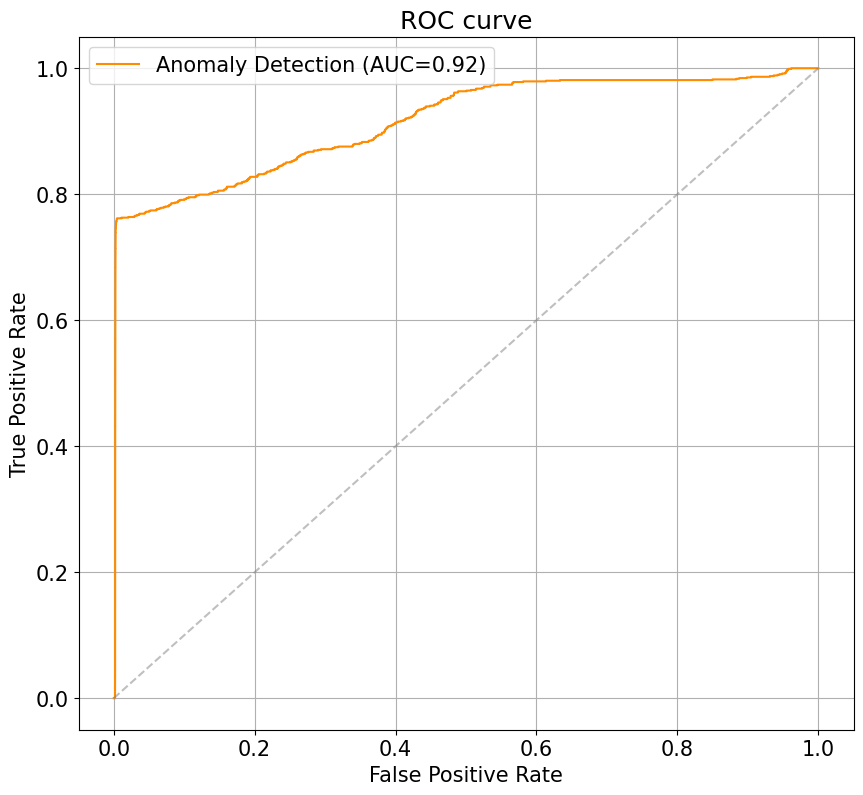


Best probability threshold: p=8.50%


In [28]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

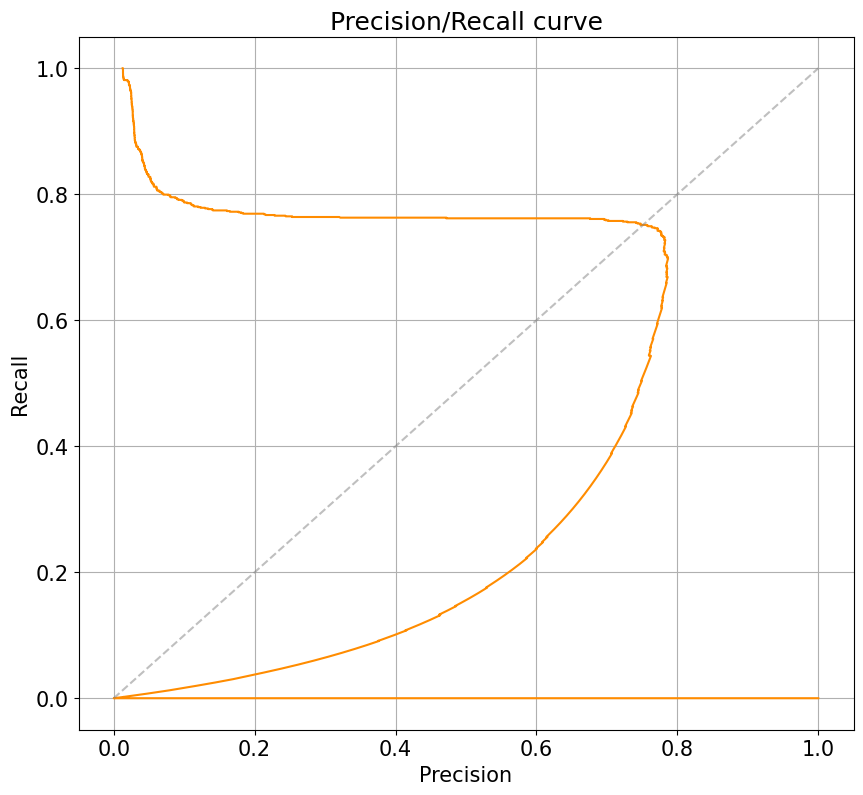

In [29]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

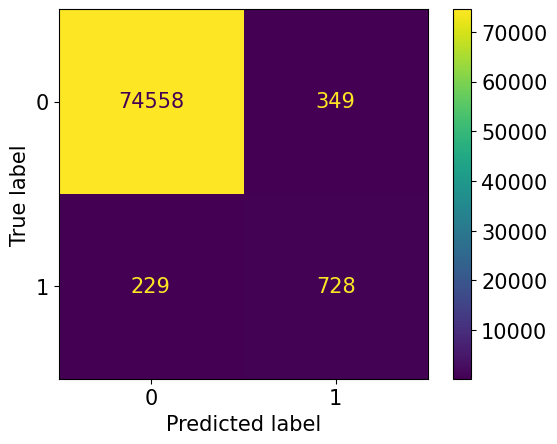


Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     74907
           1       0.68      0.76      0.72       957

    accuracy                           0.99     75864
   macro avg       0.84      0.88      0.86     75864
weighted avg       0.99      0.99      0.99     75864



In [30]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

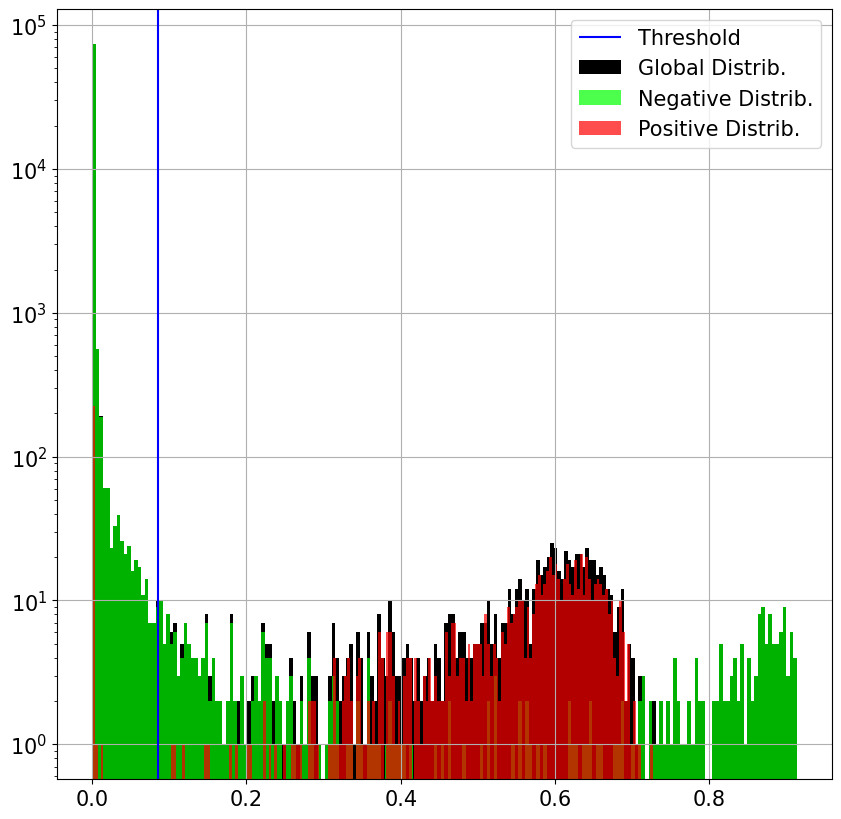

In [31]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 24

In [32]:
window_size = 24
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [33]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 2625.500045252964, Train Acc at 50%: 0.9892071680695086


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 601.9305367001539, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 476.1663498959182, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 438.1085166078378, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 368.6257353606661, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 296.29000362023714, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 253.93571816453976, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 239.1653769571907, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 231.11238573626574, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 227.3209566476604, Train Acc at 50%: 0.9895691917820617


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 224.46694270974749, Train Acc at 50%: 0.9891110055208616


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 213.50911847225993, Train Acc at 50%: 0.9941114580505023


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 211.20710019006245, Train Acc at 50%: 0.9947280296859444


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 211.5041180197303, Train Acc at 50%: 0.9947732826500135


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 214.10161553081727, Train Acc at 50%: 0.994450855281021


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 211.71096931849036, Train Acc at 50%: 0.9943886324554259


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 202.34229342021902, Train Acc at 50%: 0.9954520771110508


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 194.9047198841524, Train Acc at 50%: 0.9954577337315594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 191.94768757353606, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 188.8512421938637, Train Acc at 50%: 0.9955312697981717


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 183.61665082812925, Train Acc at 50%: 0.9955199565571545


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 191.6828446013214, Train Acc at 50%: 0.995305004977826


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 192.01366639514887, Train Acc at 50%: 0.9946035840347542


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 192.42076205991492, Train Acc at 50%: 0.9945639876911938


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 192.73339216218662, Train Acc at 50%: 0.9946658068603493


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 193.150511358494, Train Acc at 50%: 0.9949938908498507


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 184.3358674993212, Train Acc at 50%: 0.9952427821522309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 181.78499185446645, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 177.72183002986696, Train Acc at 50%: 0.995321974839352


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 177.4277423296226, Train Acc at 50%: 0.9952371255317223


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 177.56559417141824, Train Acc at 50%: 0.9952427821522309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 177.1796316408725, Train Acc at 50%: 0.9952371255317223


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 176.6820074214861, Train Acc at 50%: 0.9952314689112137


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 175.7744026608743, Train Acc at 50%: 0.9952654086342655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 175.00836048511178, Train Acc at 50%: 0.9952767218752828


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 174.1091614625758, Train Acc at 50%: 0.9952371255317223


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 177.6664177753643, Train Acc at 50%: 0.9952088424291791


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 176.80285546203277, Train Acc at 50%: 0.9952710652547742


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 174.83883156846773, Train Acc at 50%: 0.9952597520137569


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 171.90111096026789, Train Acc at 50%: 0.9950617702959544


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 172.01820300479682, Train Acc at 50%: 0.9952597520137569


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 172.4268372703412, Train Acc at 50%: 0.9952427821522309


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 171.41998144628474, Train Acc at 50%: 0.9952144990496877


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 170.9599511267988, Train Acc at 50%: 0.9951975291881618


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 171.3240904154222, Train Acc at 50%: 0.9952088424291791


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 170.17928093040095, Train Acc at 50%: 0.9952144990496877


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 168.95618381754005, Train Acc at 50%: 0.9951296497420581


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 168.29461942257217, Train Acc at 50%: 0.9950165173318852


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 176.14388179925785, Train Acc at 50%: 0.9951070232600235


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 173.15436917368086, Train Acc at 50%: 0.9953446013213866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 169.96652411982984, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 164.98584713548738, Train Acc at 50%: 0.9947789392705222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 172.22417187075754, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 168.1361887953661, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 164.7704769662413, Train Acc at 50%: 0.9950052040908679


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 165.33274504480045, Train Acc at 50%: 0.9953502579418952


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 164.45134175038464, Train Acc at 50%: 0.9953163182188434


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 163.15899628925695, Train Acc at 50%: 0.9949712643678161


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 167.10754366911033, Train Acc at 50%: 0.9953785410444385


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 164.5919992759526, Train Acc at 50%: 0.9954181373879989


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 161.22735089148338, Train Acc at 50%: 0.9948411620961173


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 163.92530998280387, Train Acc at 50%: 0.9954407638700334


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 161.99426418680423, Train Acc at 50%: 0.9949542945062901


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 162.91594261924155, Train Acc at 50%: 0.9954916734546113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 160.16124762421938, Train Acc at 50%: 0.9948694451986605


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 162.47272377590733, Train Acc at 50%: 0.9954237940085076


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 160.25179880532176, Train Acc at 50%: 0.9950787401574803


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 160.14987781699702, Train Acc at 50%: 0.9955029866956285


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 158.3140216309168, Train Acc at 50%: 0.9949712643678161


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 160.72775816816002, Train Acc at 50%: 0.995401167526473


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 159.9984387727396, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 156.140702778532, Train Acc at 50%: 0.9948637885781518


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 159.17357905692822, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 157.46292650918636, Train Acc at 50%: 0.9953785410444385


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 155.06093311611912, Train Acc at 50%: 0.9951522762240926


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 157.16836365281927, Train Acc at 50%: 0.9955029866956285


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 154.7574554258304, Train Acc at 50%: 0.9949429812652729


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 156.38302108788125, Train Acc at 50%: 0.9954237940085076


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 155.75639198117477, Train Acc at 50%: 0.9954520771110508


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 152.23717078468638, Train Acc at 50%: 0.994892071680695


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 155.26698117476695, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 154.62843922526926, Train Acc at 50%: 0.9955086433161372


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 150.40901891573898, Train Acc at 50%: 0.9948581319576433


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 153.48823422934203, Train Acc at 50%: 0.9954860168341026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 153.1575142546837, Train Acc at 50%: 0.995480360213594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 149.4681306000543, Train Acc at 50%: 0.9951353063625668


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 150.82528961897003, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 151.25194587745497, Train Acc at 50%: 0.9953276314598606


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 150.32424880079645, Train Acc at 50%: 0.9955142999366459


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 147.09511041723232, Train Acc at 50%: 0.9949599511267988


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 150.29714227531903, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 149.82458819802696, Train Acc at 50%: 0.995480360213594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 148.0532853651914, Train Acc at 50%: 0.9955199565571545


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 145.1278056837723, Train Acc at 50%: 0.9949712643678161


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 146.78930219929404, Train Acc at 50%: 0.9954916734546113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 144.46802878088513, Train Acc at 50%: 0.995401167526473


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 143.49919675988778, Train Acc at 50%: 0.9954747035930853


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 141.77272830120373, Train Acc at 50%: 0.9952654086342655


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 143.02843017467643, Train Acc at 50%: 0.9954237940085076


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 141.48904878269528, Train Acc at 50%: 0.9954577337315594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 142.99822382116028, Train Acc at 50%: 0.9953276314598606


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 141.47344782333244, Train Acc at 50%: 0.9953559145624038


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 141.80193908951037, Train Acc at 50%: 0.9954577337315594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 138.94526653995837, Train Acc at 50%: 0.9953955109059643


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 140.4579939361028, Train Acc at 50%: 0.9954407638700334


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 139.58874106253958, Train Acc at 50%: 0.9955086433161372


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 136.08595800524935, Train Acc at 50%: 0.99562177572631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 138.29099918544665, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 139.68550321296044, Train Acc at 50%: 0.9957349081364829


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 138.20854828491267, Train Acc at 50%: 0.9954520771110508


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 134.91533170422662, Train Acc at 50%: 0.9955312697981717


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 135.1873020182822, Train Acc at 50%: 0.9954351072495249


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 133.78380396415966, Train Acc at 50%: 0.9951070232600235


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 134.27932392071682, Train Acc at 50%: 0.9959668295773373


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 134.4970585573355, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 132.6481129513983, Train Acc at 50%: 0.995480360213594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 130.91653090777447, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 130.01320255226716, Train Acc at 50%: 0.9957235948954657


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 131.04698388994478, Train Acc at 50%: 0.9955369264186804


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 130.14698162729658, Train Acc at 50%: 0.9953898542854557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 128.5546316408725, Train Acc at 50%: 0.9952710652547742


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 127.98522490723143, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 128.08593537876732, Train Acc at 50%: 0.9953502579418952


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 126.87040682414698, Train Acc at 50%: 0.9955821793827496


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 126.99717168974568, Train Acc at 50%: 0.9954124807674902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 126.05719974658341, Train Acc at 50%: 0.9955086433161372


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 125.40310209068694, Train Acc at 50%: 0.9953163182188434


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 125.61070006335414, Train Acc at 50%: 0.9955256131776631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 125.23780432618337, Train Acc at 50%: 0.995576522762241


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 124.09208978188072, Train Acc at 50%: 0.995480360213594


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 123.97044981446285, Train Acc at 50%: 0.995576522762241


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 123.93751696986152, Train Acc at 50%: 0.9955029866956285


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 122.97289347452258, Train Acc at 50%: 0.995576522762241


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 123.00322427368992, Train Acc at 50%: 0.9954916734546113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 122.18663453706218, Train Acc at 50%: 0.995559552900715


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 122.20157932844602, Train Acc at 50%: 0.9955369264186804


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 121.78400760249797, Train Acc at 50%: 0.9956161191058014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 122.21613946963527, Train Acc at 50%: 0.9955425830391891


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 121.22540501402842, Train Acc at 50%: 0.9954916734546113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 120.63216128156394, Train Acc at 50%: 0.9955199565571545


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 120.23135577880352, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 120.46085618608019, Train Acc at 50%: 0.9956048058647842


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 119.79838673183093, Train Acc at 50%: 0.9956161191058014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 119.53809168250521, Train Acc at 50%: 0.9955652095212236


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 119.00423115214046, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 119.07776721875283, Train Acc at 50%: 0.9955934926237668


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 118.57855914562404, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 118.5799054213051, Train Acc at 50%: 0.9955934926237668


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 118.00739885962531, Train Acc at 50%: 0.9954464204905421


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 117.98488551000091, Train Acc at 50%: 0.9956048058647842


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 117.40371300570187, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 117.58131957643225, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 117.11938863245543, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 116.7550343922527, Train Acc at 50%: 0.9955878360032582


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 116.31612589374605, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 116.55020816363472, Train Acc at 50%: 0.995638745587836


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 116.07955471083356, Train Acc at 50%: 0.9954973300751199


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 115.74140193682686, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 115.54536609647931, Train Acc at 50%: 0.995638745587836


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 115.44025477418771, Train Acc at 50%: 0.99562177572631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 114.98748755543488, Train Acc at 50%: 0.9956274323468187


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 115.02123495338945, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 114.51744501764865, Train Acc at 50%: 0.9956104624852928


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 114.4828491266178, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 114.03388315684677, Train Acc at 50%: 0.995638745587836


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 114.22431894289076, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 113.6931283374061, Train Acc at 50%: 0.9955199565571545


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 113.5782650013576, Train Acc at 50%: 0.9956783419313965


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 113.2411643587655, Train Acc at 50%: 0.9956274323468187


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 113.27995746221377, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 112.82079826228617, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 112.82947551814644, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 112.46790433523395, Train Acc at 50%: 0.99562177572631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 112.36568920264277, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 112.07626255769753, Train Acc at 50%: 0.99562177572631


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 111.9643293510725, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 111.80454113494434, Train Acc at 50%: 0.995638745587836


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 111.6296497420581, Train Acc at 50%: 0.9956274323468187


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 111.40852113313422, Train Acc at 50%: 0.9956274323468187


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 111.29740247986243, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 111.17187075753462, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 111.01219567381663, Train Acc at 50%: 0.9956444022083446


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 110.82845732645488, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 110.76235405919088, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 110.60783781337678, Train Acc at 50%: 0.9956330889673274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 110.44593402117839, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 110.35597112860893, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 110.26703774097203, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 110.04308082179382, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 110.00324690017196, Train Acc at 50%: 0.9956557154493619


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 109.88247805231242, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 109.71687483030138, Train Acc at 50%: 0.9956500588288533


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 109.60135532627388, Train Acc at 50%: 0.9956670286903793


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 109.5215290976559, Train Acc at 50%: 0.9956726853108878


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 109.35261109602679, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 109.27979907683954, Train Acc at 50%: 0.9956670286903793


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 109.2207439587293, Train Acc at 50%: 0.9956783419313965


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 109.08900126708299, Train Acc at 50%: 0.9956613720698706


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 108.94251742239116, Train Acc at 50%: 0.9956670286903793


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 108.93634039279573, Train Acc at 50%: 0.9956896551724138


In [34]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

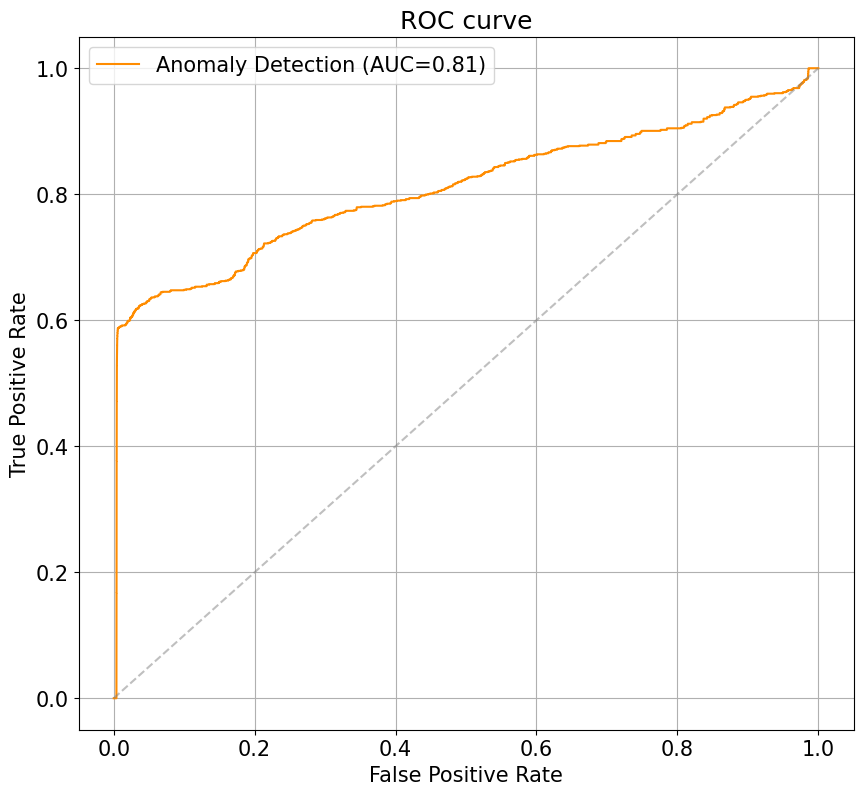


Best probability threshold: p=0.19%


In [35]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")


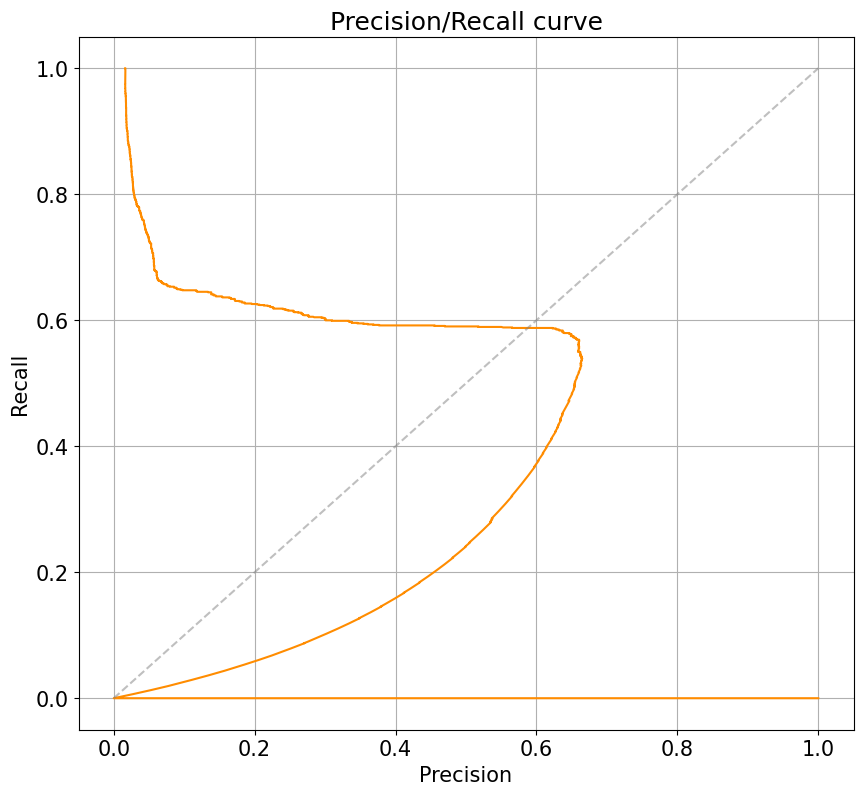

In [36]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

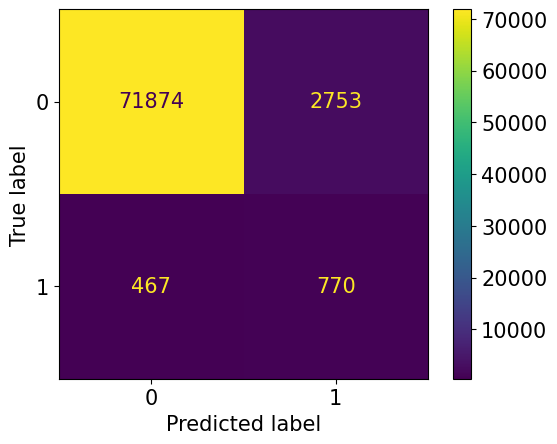


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.96      0.98     74627
           1       0.22      0.62      0.32      1237

    accuracy                           0.96     75864
   macro avg       0.61      0.79      0.65     75864
weighted avg       0.98      0.96      0.97     75864



In [37]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

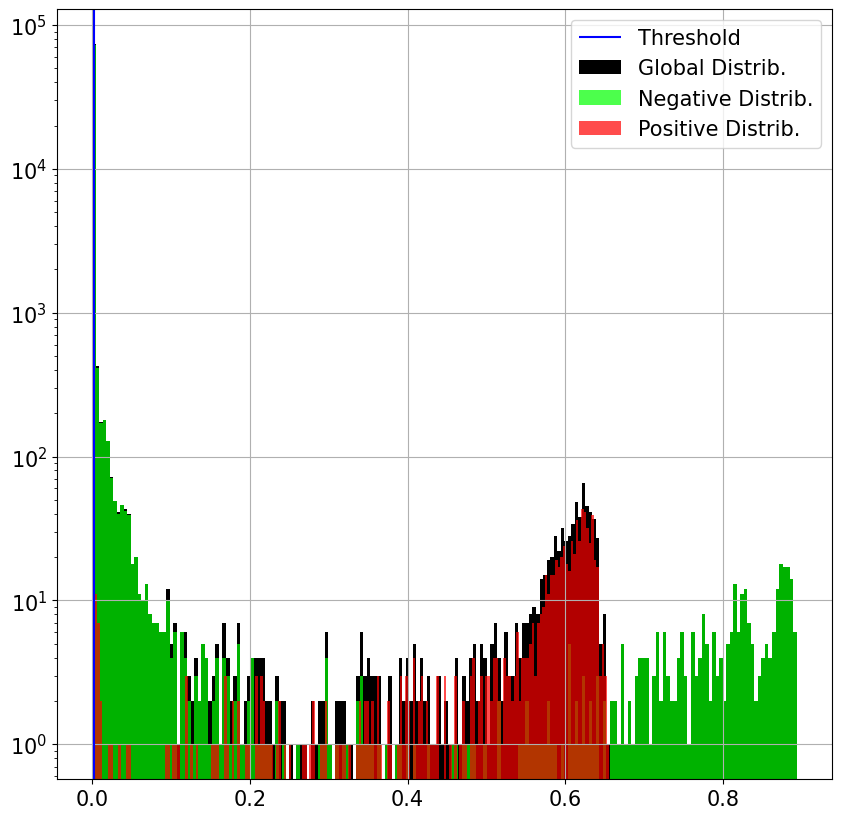

In [38]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 64

In [39]:
window_size = 64
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [40]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 1746.6771653543308, Train Acc at 50%: 0.9861299665128066


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 564.9737985338039, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 486.1391076115486, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 465.6808308444203, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 440.36559869671464, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 405.7109240655263, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 372.92463118834286, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 344.95305004977826, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 328.04631640872475, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 314.0371074305367, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 305.8982260838085, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 299.5030772015567, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 295.74943433794914, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 293.4959272332338, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 290.70983799438864, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 287.8526563489909, Train Acc at 50%: 0.9868540139379129


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 286.13091682505205, Train Acc at 50%: 0.9871425015838537


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 281.4702688026066, Train Acc at 50%: 0.992719929405376


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 278.34014390442576, Train Acc at 50%: 0.9926859896823242


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 275.27411982984887, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 273.09518960991943, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 272.04265091863516, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 270.795162458141, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 269.99775997827857, Train Acc at 50%: 0.992974477328265


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 265.3424291791112, Train Acc at 50%: 0.992974477328265


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 264.92915648474974, Train Acc at 50%: 0.9929914471897909


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 262.1651959453344, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 260.3104127070323, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 258.7602271698796, Train Acc at 50%: 0.9929971038102996


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 256.66886143542405, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 255.20963435605032, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 254.4222554077292, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 255.00710471535885, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 254.05409991854467, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 252.86100552086162, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 250.9052855462033, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 250.04527559055117, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 247.56984795004072, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 249.67981265272874, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 246.70361571182912, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 248.30950764775093, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 245.1396053941533, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 246.84727124626664, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 243.49945696443118, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 244.23273599420762, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 242.29491356683863, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 242.7271472531451, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 241.37220562946874, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 243.74380034392252, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 239.4586387908408, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 241.90492352249072, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 238.12195673816635, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 238.5856638609829, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 236.30489184541588, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 239.26916463028329, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 236.64723051859897, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 235.15736718255044, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 234.91358946510996, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 232.55240293239208, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 236.01979817178025, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 231.14492261743143, Train Acc at 50%: 0.9929971038102996


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 235.4316001448095, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 230.33826590641686, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 235.70237125531722, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 231.3801701511449, Train Acc at 50%: 0.992957507466739


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 233.132183908046, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 227.8024934383202, Train Acc at 50%: 0.9929518508462304


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 231.9043126074758, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 225.45388722961354, Train Acc at 50%: 0.9929971038102996


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 228.86582496153497, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 225.31808308444204, Train Acc at 50%: 0.9929971038102996


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 225.81464385917278, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 223.38188976377953, Train Acc at 50%: 0.992895284641144


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 228.79072766766222, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 221.72965879265092, Train Acc at 50%: 0.9930706398769119


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 230.34059643406644, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 222.9465336229523, Train Acc at 50%: 0.9932912480767491


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 225.18865960720427, Train Acc at 50%: 0.9929857905692823


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 218.6659199927595, Train Acc at 50%: 0.9930593266358947


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 226.7465381482487, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 219.42180287808853, Train Acc at 50%: 0.9931158928409811


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 218.97020092316046, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 215.13799891392887, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 222.10134401303284, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 214.15173318852385, Train Acc at 50%: 0.9929857905692823


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 217.15453887229614, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 210.57799348357318, Train Acc at 50%: 0.9929914471897909


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 218.55932663589465, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 214.60808670467915, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 207.89729839804508, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 214.704860168341, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 210.75009050592814, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 206.8746719160105, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 211.57272151325913, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 205.52658611639063, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 209.2340935831297, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 207.20447551814644, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 200.2904335233958, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 208.19698615259298, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 205.421463480858, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 201.58052764956105, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 198.7976966241289, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 203.21017739161914, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 200.32023260023533, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 195.82772196578875, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 200.57869490451625, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 199.44852475337134, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 192.72601592904334, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 197.24361933206626, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 194.4142003801249, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 188.7344216671192, Train Acc at 50%: 0.9930197302923341


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 194.71291519594533, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 193.5336455787854, Train Acc at 50%: 0.9930027604308083


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 190.87946873020184, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 190.04065978821612, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 183.7563580414517, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 189.2357340030772, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 186.6283939723052, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 185.5338265906417, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 184.64484342474432, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 181.91399674178658, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 182.26673228346456, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 177.90447099285004, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 181.06554891845417, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 179.90364512625578, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 179.4982917006064, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 175.94158973662775, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 176.80467689383656, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 171.91817132772198, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 175.36993166802426, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 173.28734500859807, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 173.41925739885963, Train Acc at 50%: 0.9930084170513168


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 170.73987464928953, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 170.67792334147887, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 168.07266494705402, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 169.3896053941533, Train Acc at 50%: 0.9930140736718255


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 167.14173228346456, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 168.0927346366187, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 165.05623812109692, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 166.07702054484568, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 164.57324192234591, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 165.36195583310706, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 162.50717259480496, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 163.05979047877636, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 161.57011946782515, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 161.45736039460584, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 160.8605416779799, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 162.018972305186, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 159.9233527921079, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 160.00917503846503, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 158.38431079735722, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 158.7955471083356, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 157.58269979183638, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 158.3857362657254, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 156.8537989863336, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 156.59805185989683, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 156.29870350257943, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 155.66565978821612, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 155.6651733188524, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 154.67926961715992, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 154.79681419132953, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 154.45050457054938, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 153.77942573988597, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 154.97422843696262, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 152.7431441759435, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 152.64285229432528, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 151.90629242465383, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 152.01594035659335, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 151.26818037831478, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 151.6189700425378, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 151.60446646755364, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 150.57067381663498, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 150.11416191510543, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 149.92732373970495, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 149.45200923160468, Train Acc at 50%: 0.9930423567743687


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 149.54586387908407, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 149.05781066159832, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 149.69137478504842, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 148.5316770748484, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 148.4498710290524, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 148.27026201466197, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 148.43859172775817, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 147.43255045705493, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 147.5861955833107, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 146.9499954747036, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 147.20672685310888, Train Acc at 50%: 0.9930480133948774


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 146.53647388903974, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 146.76168657797086, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 146.2741650828129, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 146.23336953570458, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 145.7999253326093, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 146.06746085618607, Train Acc at 50%: 0.9930762964974206


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 145.67932618336502, Train Acc at 50%: 0.99303670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 145.61572314236582, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 145.04329577337316, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 145.38329260566567, Train Acc at 50%: 0.9930819531179292


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 144.94680514073673, Train Acc at 50%: 0.9930310435333515


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 144.86214815820435, Train Acc at 50%: 0.993053670015386


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 144.43557109240655, Train Acc at 50%: 0.9930253869128428


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 144.7735089148339, Train Acc at 50%: 0.9930819531179292


In [41]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

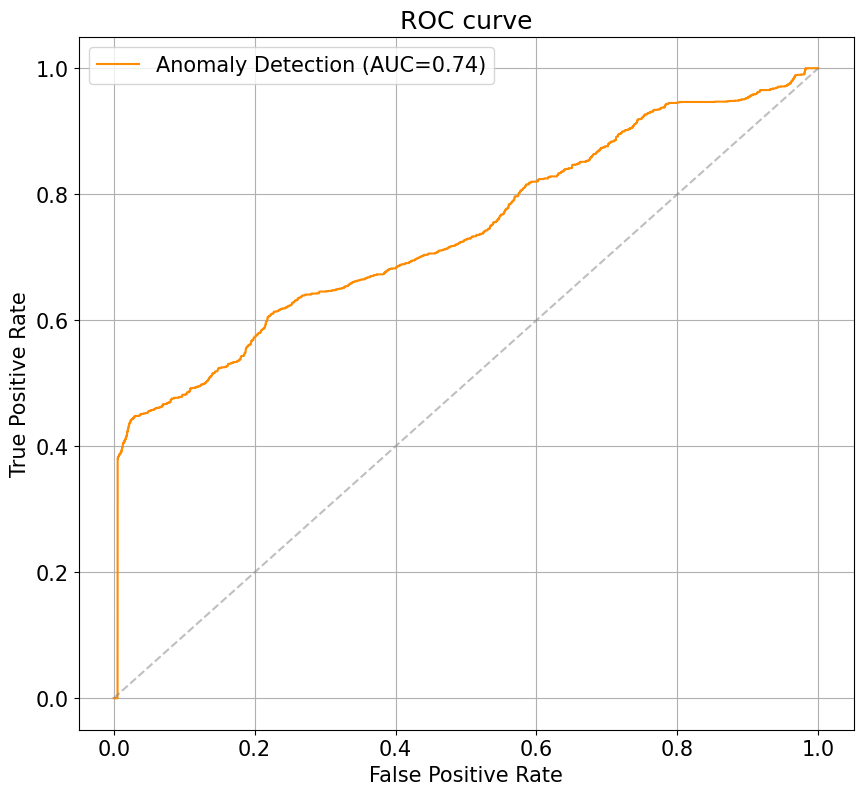


Best probability threshold: p=1.63%


In [42]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

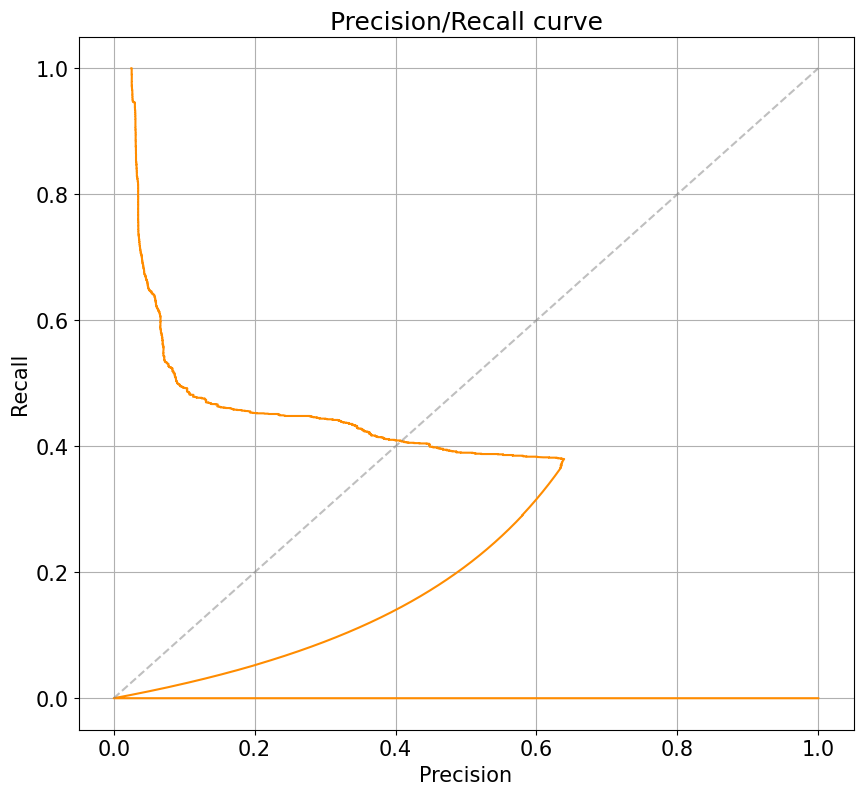

In [43]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

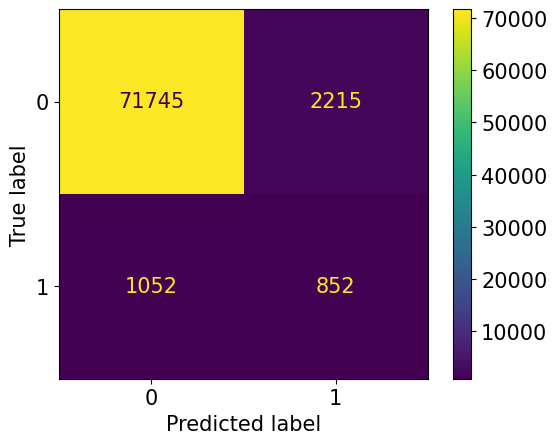


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     73960
           1       0.28      0.45      0.34      1904

    accuracy                           0.96     75864
   macro avg       0.63      0.71      0.66     75864
weighted avg       0.97      0.96      0.96     75864



In [44]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

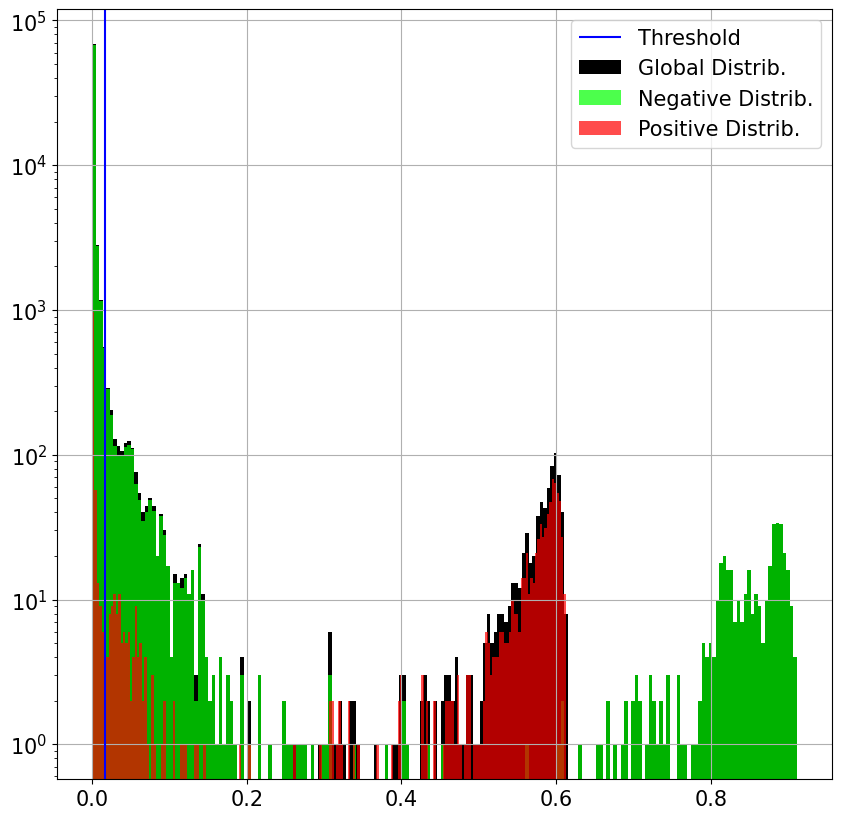

In [45]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 192

In [46]:
window_size = 192
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [47]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 922.1556701963979, Train Acc at 50%: 0.9772038193501674


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 533.0345732645488, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 486.59742963164086, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 472.302335052946, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 468.0533079916735, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 459.7664947054032, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 451.2179835279211, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 442.50701420943074, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 435.97085709113946, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 441.66444927142726, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 447.64277310163817, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 435.2741424563309, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 421.3160014480948, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 410.094895465653, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 403.34491809213506, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 399.8458231514164, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 396.51411892478956, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 393.5052945967961, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 390.66960810933114, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 388.2110145714544, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 386.7864965155218, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 388.55570639876913, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 384.77495700968416, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 379.7564032944158, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 376.72832383021085, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 374.87089329351073, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 370.7424201285184, Train Acc at 50%: 0.9775658430627207


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 366.9177979907684, Train Acc at 50%: 0.9803602135939904


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 365.12351796542674, Train Acc at 50%: 0.9842463118834284


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 363.73058647841435, Train Acc at 50%: 0.9842463118834284


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 360.3485157027785, Train Acc at 50%: 0.9842632817449543


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 356.8887908408001, Train Acc at 50%: 0.9842802516064802


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 355.9773961444475, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 355.6558964612182, Train Acc at 50%: 0.9842802516064802


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 351.79842067155397, Train Acc at 50%: 0.9842859082269889


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 350.1822110598244, Train Acc at 50%: 0.9842915648474975


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 350.0422888949226, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 349.8572721513259, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 347.4528011584759, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 346.3944022083447, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 346.516336320029, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 344.4763779527559, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 343.5662277129152, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 342.66474341569375, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 341.6707620599149, Train Acc at 50%: 0.9842745949859716


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 340.33937460403655, Train Acc at 50%: 0.9842632817449543


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 339.9951805593266, Train Acc at 50%: 0.9842632817449543


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 339.0402298850575, Train Acc at 50%: 0.9842293420219025


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 338.3343062720608, Train Acc at 50%: 0.984234998642411


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 337.16297855009503, Train Acc at 50%: 0.9841671191963074


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 337.07785772468094, Train Acc at 50%: 0.9840766132681691


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 335.7330301384741, Train Acc at 50%: 0.9840539867861345


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 335.12994388632455, Train Acc at 50%: 0.9840257036835913


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 334.1403746945425, Train Acc at 50%: 0.9840370169246085


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 333.3410489637071, Train Acc at 50%: 0.9840087338220653


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 332.6978912118744, Train Acc at 50%: 0.984014390442574


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 331.88885872024616, Train Acc at 50%: 0.9839917639605394


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 331.3542854556973, Train Acc at 50%: 0.9839917639605394


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 330.79710833559596, Train Acc at 50%: 0.9840426735451172


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 329.59003077201555, Train Acc at 50%: 0.9839465109964702


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 330.5486921893384, Train Acc at 50%: 0.9839521676169789


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 328.73273599420764, Train Acc at 50%: 0.9839578242374876


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 327.7410851660784, Train Acc at 50%: 0.9839465109964702


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 327.6190379219839, Train Acc at 50%: 0.9839804507195221


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 326.73223821160286, Train Acc at 50%: 0.9839861073400308


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 326.0077835098199, Train Acc at 50%: 0.9840030772015567


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 325.56048058647843, Train Acc at 50%: 0.9839747940990135


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 324.55760702326, Train Acc at 50%: 0.9840313603040999


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 324.041225450267, Train Acc at 50%: 0.984014390442574


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 323.36245361571184, Train Acc at 50%: 0.9840200470630827


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 322.57317404289984, Train Acc at 50%: 0.9840087338220653


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 322.59792741424565, Train Acc at 50%: 0.9840426735451172


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 321.25506833197574, Train Acc at 50%: 0.9840030772015567


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 320.96325459317586, Train Acc at 50%: 0.9840653000271518


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 319.9425287356322, Train Acc at 50%: 0.9840766132681691


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 319.6787265815911, Train Acc at 50%: 0.9840709566476604


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 318.8678387184361, Train Acc at 50%: 0.9841218662322382


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 318.17659969227986, Train Acc at 50%: 0.9841162096117295


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 317.41365734455604, Train Acc at 50%: 0.9840879265091863


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 317.0663634718074, Train Acc at 50%: 0.9841444927142727


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 316.8560955742601, Train Acc at 50%: 0.9841444927142727


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 315.74133405738075, Train Acc at 50%: 0.9840822698886778


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 315.0370395510906, Train Acc at 50%: 0.9842689383654629


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 315.52631459860623, Train Acc at 50%: 0.9841840890578333


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 313.6830256131777, Train Acc at 50%: 0.9841671191963074


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 313.1732735994208, Train Acc at 50%: 0.9841501493347814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 313.15028509367363, Train Acc at 50%: 0.9841558059552901


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 312.16870305004977, Train Acc at 50%: 0.9841501493347814


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 311.55271970314055, Train Acc at 50%: 0.9840822698886778


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 311.504570549371, Train Acc at 50%: 0.984647931939542


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 311.0237351796543, Train Acc at 50%: 0.9841897456783419


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 309.91051226355324, Train Acc at 50%: 0.9841275228527468


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 309.4833695357046, Train Acc at 50%: 0.9841897456783419


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 308.56265272875373, Train Acc at 50%: 0.9841954022988506


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 307.7916101004616, Train Acc at 50%: 0.9841671191963074


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 306.81796995203183, Train Acc at 50%: 0.9842689383654629


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 306.4056249434338, Train Acc at 50%: 0.9840992397502036


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 305.44366005973393, Train Acc at 50%: 0.9844952031858086


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 305.481672549552, Train Acc at 50%: 0.9843141913295321


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 304.1986831387456, Train Acc at 50%: 0.9840992397502036


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 304.2697981717802, Train Acc at 50%: 0.9847554077292062


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 303.1838175400489, Train Acc at 50%: 0.984331161191058


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 302.3168386279301, Train Acc at 50%: 0.9843141913295321


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 301.5361344918092, Train Acc at 50%: 0.9843028780885148


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 300.82844601321386, Train Acc at 50%: 0.9843537876730926


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 299.9952258122907, Train Acc at 50%: 0.9842293420219025


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 299.0798488551, Train Acc at 50%: 0.9844386369807222


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 298.7693230156575, Train Acc at 50%: 0.9844952031858086


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 299.10881075210426, Train Acc at 50%: 0.9845913657344556


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 296.5462711557607, Train Acc at 50%: 0.9843877273961444


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 296.1754683681781, Train Acc at 50%: 0.9843424744320753


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 294.3998099375509, Train Acc at 50%: 0.9845121730473346


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 294.1775952574894, Train Acc at 50%: 0.9842293420219025


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 291.59297221468006, Train Acc at 50%: 0.9842406552629197


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 290.76065707303826, Train Acc at 50%: 0.984093583129695


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 293.7492080731288, Train Acc at 50%: 0.984964702688026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 290.1960132138655, Train Acc at 50%: 0.9841671191963074


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 288.55251606480226, Train Acc at 50%: 0.984919449723957


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 287.2821974839352, Train Acc at 50%: 0.984014390442574


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 291.766992488008, Train Acc at 50%: 0.9845630826319124


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 289.5448456873925, Train Acc at 50%: 0.9850269255136211


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 286.6554665580596, Train Acc at 50%: 0.984919449723957


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 284.5977011494253, Train Acc at 50%: 0.9843990406371618


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 282.1922798443298, Train Acc at 50%: 0.984110552991221


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 281.2808851479772, Train Acc at 50%: 0.9850099556520953


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 280.4387501131324, Train Acc at 50%: 0.9848515702778532


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 279.9975337134582, Train Acc at 50%: 0.9848289437958186


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 279.0186442211965, Train Acc at 50%: 0.9840483301656259


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 275.9447687573536, Train Acc at 50%: 0.9846988415241198


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 276.0284188614354, Train Acc at 50%: 0.9849251063444656


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 276.2421033577699, Train Acc at 50%: 0.9849929857905693


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 274.3663679971038, Train Acc at 50%: 0.9840313603040999


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 271.57912480767493, Train Acc at 50%: 0.9843594442936012


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 271.0267671282469, Train Acc at 50%: 0.9849533894470088


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 270.3209792741425, Train Acc at 50%: 0.9848119739342927


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 269.3401212779437, Train Acc at 50%: 0.9847327812471717


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 268.0021268893112, Train Acc at 50%: 0.984014390442574


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 270.41607837813376, Train Acc at 50%: 0.9850156122726038


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 270.1555796904697, Train Acc at 50%: 0.9842010589193593


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 266.692415603222, Train Acc at 50%: 0.9848063173137841


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 265.79346547198844, Train Acc at 50%: 0.9840879265091863


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 265.37170784686396, Train Acc at 50%: 0.9849986424110779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 264.9562403837451, Train Acc at 50%: 0.9841671191963074


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 263.7456783419314, Train Acc at 50%: 0.984981672549552


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 262.40100914109877, Train Acc at 50%: 0.9841897456783419


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 261.7792334147887, Train Acc at 50%: 0.9849703593085347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 259.46488369988236, Train Acc at 50%: 0.9842576251244457


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 258.7354511720518, Train Acc at 50%: 0.984506516426826


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 256.12019187256766, Train Acc at 50%: 0.9846422753190334


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 255.4342926961716, Train Acc at 50%: 0.9848515702778532


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 253.3431306000543, Train Acc at 50%: 0.9843198479500407


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 251.44146529097657, Train Acc at 50%: 0.9848006606932754


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 252.8357996198751, Train Acc at 50%: 0.9847158113856458


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 249.76291972124173, Train Acc at 50%: 0.9844046972576703


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 249.46402389356504, Train Acc at 50%: 0.9847158113856458


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 247.74524843877273, Train Acc at 50%: 0.9848006606932754


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 245.53735632183907, Train Acc at 50%: 0.9847101547651371


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 243.92078468639696, Train Acc at 50%: 0.9845630826319124


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 242.43800343922527, Train Acc at 50%: 0.9848515702778532


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 240.96463480857997, Train Acc at 50%: 0.9850495519956557


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 240.69845687392524, Train Acc at 50%: 0.9848289437958186


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 238.4599511267988, Train Acc at 50%: 0.9850042990315866


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 237.98463661869852, Train Acc at 50%: 0.9850212688931125


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 236.51828219748393, Train Acc at 50%: 0.9849590460675174


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 235.68750565662052, Train Acc at 50%: 0.9849703593085347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 234.50631278848763, Train Acc at 50%: 0.9850099556520953


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 234.27900714996832, Train Acc at 50%: 0.9850721784776902


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 232.915580595529, Train Acc at 50%: 0.984964702688026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 232.4401077020545, Train Acc at 50%: 0.9851457145443027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 231.69042447280296, Train Acc at 50%: 0.9849307629649742


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 230.7896642230066, Train Acc at 50%: 0.9851909675083718


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 230.1210064259209, Train Acc at 50%: 0.9849420762059915


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 229.39184541587474, Train Acc at 50%: 0.9851909675083718


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 228.6873020182822, Train Acc at 50%: 0.9849251063444656


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 228.2980360213594, Train Acc at 50%: 0.9852758168160014


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 227.64879174585934, Train Acc at 50%: 0.9847893474522581


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 226.95829939361028, Train Acc at 50%: 0.9852927866775274


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 226.69067336410535, Train Acc at 50%: 0.9848798533803964


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 225.94053760521314, Train Acc at 50%: 0.9852135939904064


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 225.6660331251697, Train Acc at 50%: 0.984919449723957


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 225.04190424472802, Train Acc at 50%: 0.9851626844058285


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 224.70961172956828, Train Acc at 50%: 0.984964702688026


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 224.27122364014843, Train Acc at 50%: 0.9851457145443027


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 223.92612453615712, Train Acc at 50%: 0.984981672549552


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 223.50631278848763, Train Acc at 50%: 0.9851230880622681


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 223.12209249705856, Train Acc at 50%: 0.9849760159290434


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 222.94001719612635, Train Acc at 50%: 0.985140057923794


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 222.37693456421397, Train Acc at 50%: 0.9849703593085347


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 222.30676984342475, Train Acc at 50%: 0.9851513711648113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 221.74904968775454, Train Acc at 50%: 0.984981672549552


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 221.72940990134853, Train Acc at 50%: 0.9851513711648113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 221.11980722237305, Train Acc at 50%: 0.9849986424110779


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 221.18967779889581, Train Acc at 50%: 0.9851513711648113


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 220.5839668748303, Train Acc at 50%: 0.9850099556520953


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 220.67078468639696, Train Acc at 50%: 0.9851626844058285


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 220.08797176215043, Train Acc at 50%: 0.9850269255136211


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 220.24493166802426, Train Acc at 50%: 0.9851739976468459


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 219.6060955742601, Train Acc at 50%: 0.9850269255136211


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 219.83939723051859, Train Acc at 50%: 0.9851739976468459


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 219.20551633632002, Train Acc at 50%: 0.9850269255136211


In [48]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

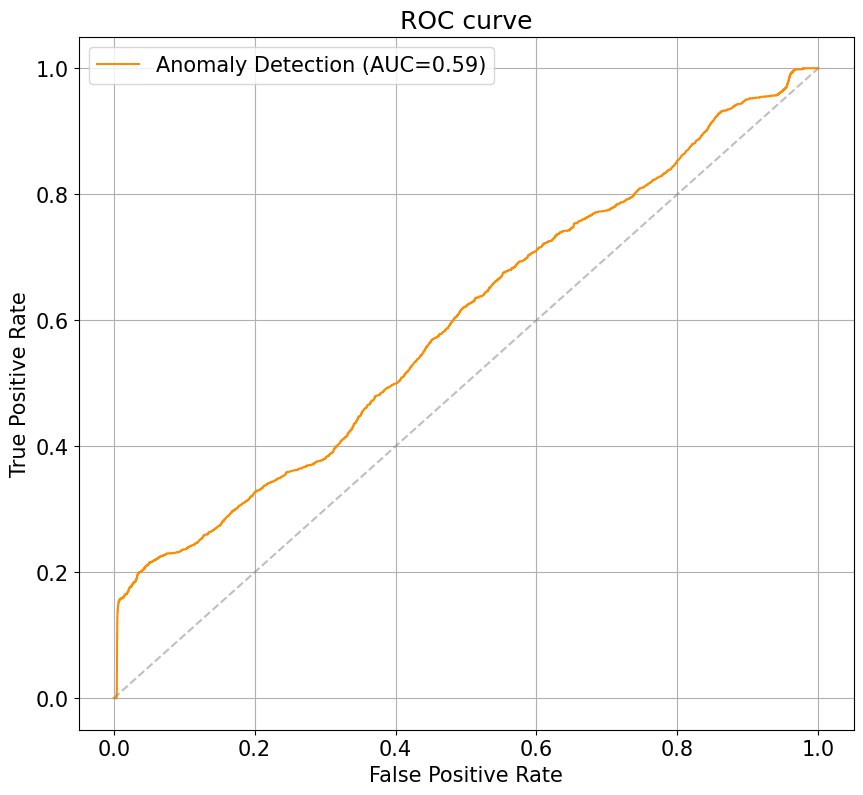


Best probability threshold: p=3.07%


In [49]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

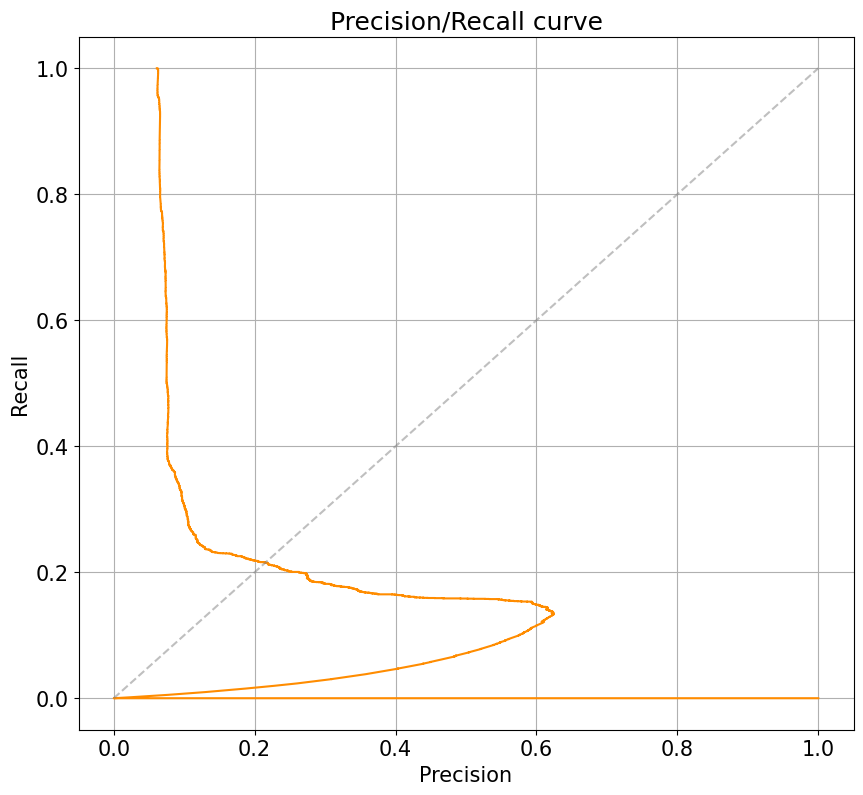

In [50]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

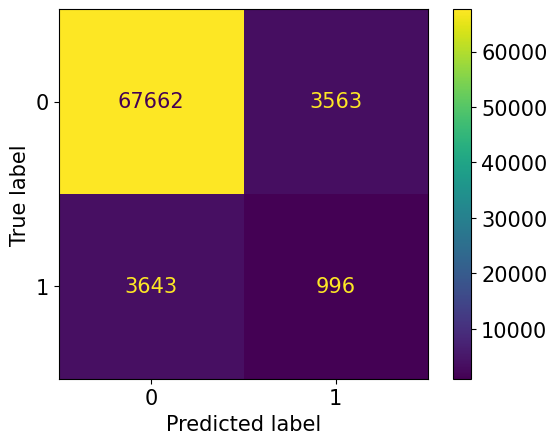


Classification Report
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     71225
           1       0.22      0.21      0.22      4639

    accuracy                           0.91     75864
   macro avg       0.58      0.58      0.58     75864
weighted avg       0.90      0.91      0.90     75864



In [51]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

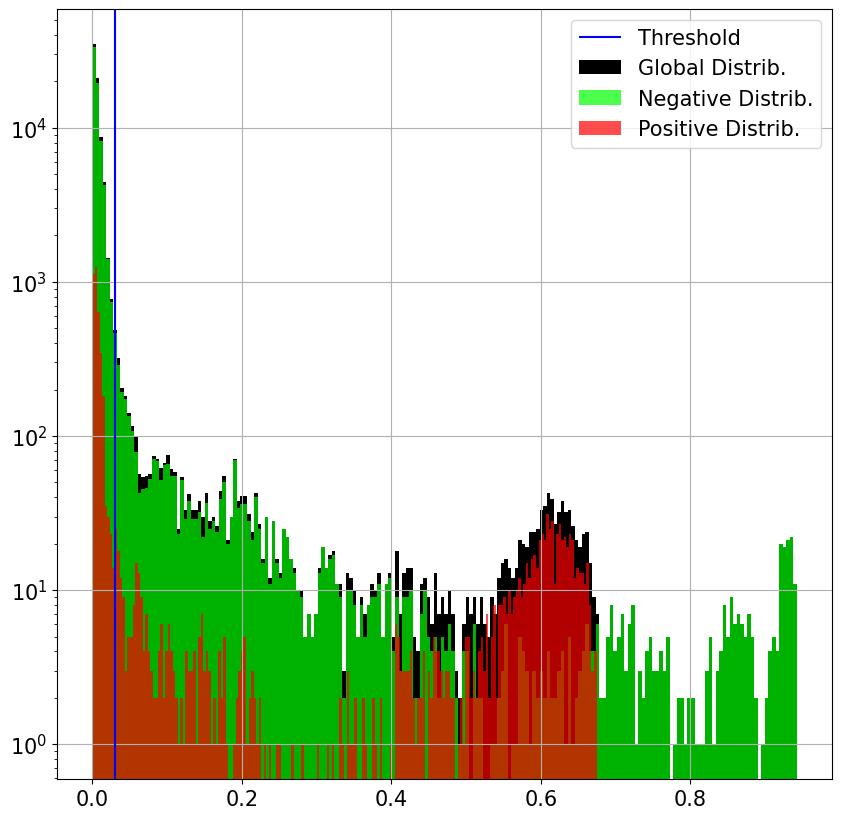

In [52]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

In [53]:
! rm -r drive/MyDrive/HPCDATA/simple
! cp -r out drive/MyDrive/HPCDATA/simple